### Notebook for the analysis if CCL5 Gene program from Xenium heart dataset

- **Developed by:** Anna Maguza
- **Affilation:**  Faculty of Medicine, Würzburg University
- **Created date:** 3rd December 2024
- **Last modified date:** 3rd December 2024

This notebook is created to calculate the clustering of the CCL5 gene program in Xenium heart dataset, and then visualized the results. The gene programs were already identified using `NicheCompass`, and optimal number of clusters was already identified previously.

### Import packages

In [1]:
import sys
import importlib
import os

import torch

import pandas as pd
import numpy as np
import scanpy as sc
import scipy
import scipy.sparse as sp
import squidpy as sq

import matplotlib.pyplot as plt

import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
sys.path.append('tools/')
import combinatorial_addressing
from combinatorial_addressing import normalize_and_filter
from combinatorial_addressing import perform_optimal_clustering, visualize_clustering_results
from combinatorial_addressing import create_basic_sankey, create_group_specific_sankeys

In [3]:
%load_ext autoreload
%autoreload 2

### Setup working environment

In [4]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'png')

### Read in data

In [5]:
adata = sc.read_h5ad('data/heart_Xenium/adata_results.h5ad')

### Define output folders

In [6]:
output_dir = f"data/heart_Xenium/"
os.makedirs(output_dir, exist_ok=True)

In [7]:
output_prefix = 'CCL5_GP'

In [8]:
k = 16

### Extract Genes from gene program

In [9]:
gp = pd.DataFrame(adata.uns['nichecompass_gp_summary'])

In [10]:
CCL5_GP = gp[gp['gp_name'] == 'CCL5_combined_GP']

In [11]:
source_genes = CCL5_GP['gp_source_genes'].values[0]
target_genes = CCL5_GP['gp_target_genes'].values[0]

In [12]:
pathway_genes = [source_genes] + target_genes.split(', ')
pathway_genes

['CCL5',
 'TNC',
 'MYC',
 'CCL5',
 'IL7R',
 'FAS',
 'EDN1',
 'VCAN',
 'STC2',
 'ESR1',
 'BCL2L11',
 'MDM2',
 'CXCL10',
 'MET',
 'CXCL2',
 'ACKR1',
 'IGF1',
 'EGFR',
 'AR',
 'PCNA',
 'PRDM1',
 'CAV1',
 'LIF',
 'CD28',
 'CXCR4',
 'CYP1A1',
 'TOP2A',
 'IL2RA',
 'CDK1',
 'PPARG']

### Anndata object pre-processing

In [13]:
adata_filtered, pathway_genes, gene_quantiles, scaler= normalize_and_filter(adata, pathway_genes, sat_val=0.99, min_genes_on=1, min_expr=0.01)
adata_filtered

View of AnnData object with n_obs × n_vars = 20829 × 30
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels', 'n_counts', 'cell_type', 'batch', 'latent_leiden_0.4', 'S100A1_ligand_receptor_GP', 'LIF_combined_GP', 'VWF_combined_GP', 'LPL_ligand_receptor_target_gene_GP', 'PRG4_ligand_receptor_target_gene_GP', 'MMRN2_ligand_receptor_target_gene_GP', 'ADAM28_ligand_receptor_target_gene_GP', 'Add-on_72_GP', 'ANGPT2_combined_GP', 'NTN4_combined_GP', 'EDN1_combined_GP', 'Add-on_42_GP', 'COL17A1_combined_GP', 'PECAM1_combined_GP', 'FBN1_ligand_receptor_target_gene_GP', 'Add-on_48_GP', 'CD274_combined_GP', 'GPC3_ligand_receptor_target_gene_GP', 'LILRB2_ligand_receptor_target_gene_GP', 'FBLN1_combined_GP', 'CD28_ligand_receptor_target_gene_GP', 'OGN_ligand_receptor_target_gene_GP', 'EPCAM_ligand_receptor_target_gene_GP', 'CXCL6_co

In [14]:
adata_filtered.obs.index = adata_filtered.obs['cell_id'].copy()

In [15]:
df = pd.DataFrame(adata_filtered.X.toarray(), 
                                          index=adata_filtered.obs_names, 
                                          columns=adata_filtered.var_names)

In [16]:
clustering_results = perform_optimal_clustering(
    data_df=df,
    pathway_genes=pathway_genes,
    optimal_k=k
)

### Analyze clustering

+ Expression heatmap, silhouette distribution, cluster size

In [17]:
visualize_clustering_results(
    results=clustering_results,
    pathway_genes=pathway_genes,
    output_dir=output_dir,
    output_prefix=f"{output_prefix}_clustering_results_k{k}"
)

In [18]:
clustering_results_df= clustering_results['data']

In [19]:
order_is_same = adata_filtered.obs.index.equals(clustering_results_df.index)
print(f"The order of cells is the same: {order_is_same}")

The order of cells is the same: True


In [20]:
adata_filtered.obs['CCL5_cluster'] = clustering_results_df['cluster'].copy()
adata_filtered.obs['CCL5_silhouette_score'] = clustering_results_df['silhouette_score'].copy()

/tmp/ipykernel_2526295/3232694477.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_filtered.obs['CCL5_cluster'] = clustering_results_df['cluster'].copy()
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


+ Sankey plot showing CCL5 clusters distribution accross cell types

In [21]:
create_basic_sankey(
    adata=adata_filtered,
    left_col='cell_type',           
    right_col='CCL5_cluster',        
    left_label='Cell Types',
    right_label='CCL5 Clusters',
    fontsize=8,    
    output_dir=output_dir,
    output_prefix=f"{output_prefix}_sankey_k{k}.png"
)

<Figure size 2700x1800 with 0 Axes>

+ Generate multiple sankey plots showing CCL5 clusters distribution accross cell types in each niche

In [22]:
create_group_specific_sankeys(
    adata=adata_filtered,
    left_col='cell_type',          
    right_col='CCL5_cluster',        
    group_col='latent_leiden_0.4',  
    left_label='Cell Types',        
    right_label='CCL5 Clusters',    
    group_label='Niche',           
    output_dir=output_dir,
    fontsize=6, 
    output_prefix=output_prefix
)

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

+ Generate multiple sankey plots showing CCL5 clusters distribution accross niche for each cell type

In [23]:
create_group_specific_sankeys(
    adata=adata_filtered,
    left_col='latent_leiden_0.4',          
    right_col='CCL5_cluster',      
    group_col='cell_type', 
    left_label='Niche',       
    right_label='CCL5 Clusters',     
    group_label='Cell Type',           
    output_dir=output_dir,
    fontsize=6, 
    output_prefix=output_prefix
)

/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/pySankey/sankey.py:91: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()
/home/amaguza/tools/combinatorial_addressing.py:829: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

<Figure size 2700x1800 with 0 Axes>

+ Visualize CCL5 clusters on tissue

In [24]:
adata_filtered.obs['CCL5_cluster'] = adata_filtered.obs['CCL5_cluster'].astype('category')

/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


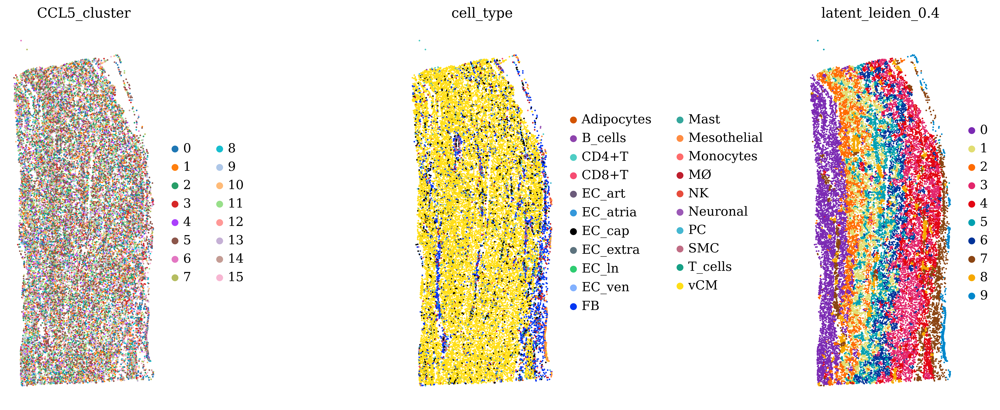

In [25]:
with plt.rc_context():
        sc.set_figure_params(dpi=300, figsize=(7, 7))
        sq.pl.spatial_scatter(
                adata_filtered,
                library_id="spatial",
                shape=None,
                color=["CCL5_cluster", 'cell_type', 'latent_leiden_0.4'],
                wspace=0.01,
                size=1.5,
                frameon=False,
                alpha=1.0)
        plt.savefig(f"{output_dir}/CCL5_clusters_on_tissue_k{k}.png", bbox_inches="tight")

+ Plot only macrophages

In [26]:
macro_mask = adata_filtered.obs['cell_type'] == 'MØ'

adata_filtered.obs['CCL5_cluster_MØ'] = adata_filtered.obs['CCL5_cluster'].copy()
adata_filtered.obs['CCL5_cluster_MØ'] = adata_filtered.obs['CCL5_cluster_MØ'].astype('category')
adata_filtered.obs['CCL5_cluster_MØ'] = adata_filtered.obs['CCL5_cluster_MØ'].cat.add_categories('Other')
adata_filtered.obs.loc[~macro_mask, 'CCL5_cluster_MØ'] = 'Other'

In [27]:
adata_filtered.obs['latent_leiden_0.4_MØ'] = adata_filtered.obs['latent_leiden_0.4'].copy()
adata_filtered.obs['latent_leiden_0.4_MØ'] = adata_filtered.obs['latent_leiden_0.4_MØ'].astype('category')
adata_filtered.obs['latent_leiden_0.4_MØ'] = adata_filtered.obs['latent_leiden_0.4_MØ'].cat.add_categories('Other')
adata_filtered.obs.loc[~macro_mask, 'latent_leiden_0.4_MØ'] = 'Other'

In [34]:
colors = ['#1f77b4','#ff7f0e','#279e68','#d62728','#aa40fc','#8c564b','#e377c2','#b5bd61','#17becf','#aec7e8','#ffbb78','#98df8a','#ff9896','#c5b0d5', '#FADA7A', '#81BFDA', '#E4E0E1']
adata_filtered.uns['CCL5_cluster_MØ_colors'] = colors

In [35]:
colors = ['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8','#E4E0E1']
adata_filtered.uns['latent_leiden_0.4_MØ_colors'] = colors

/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


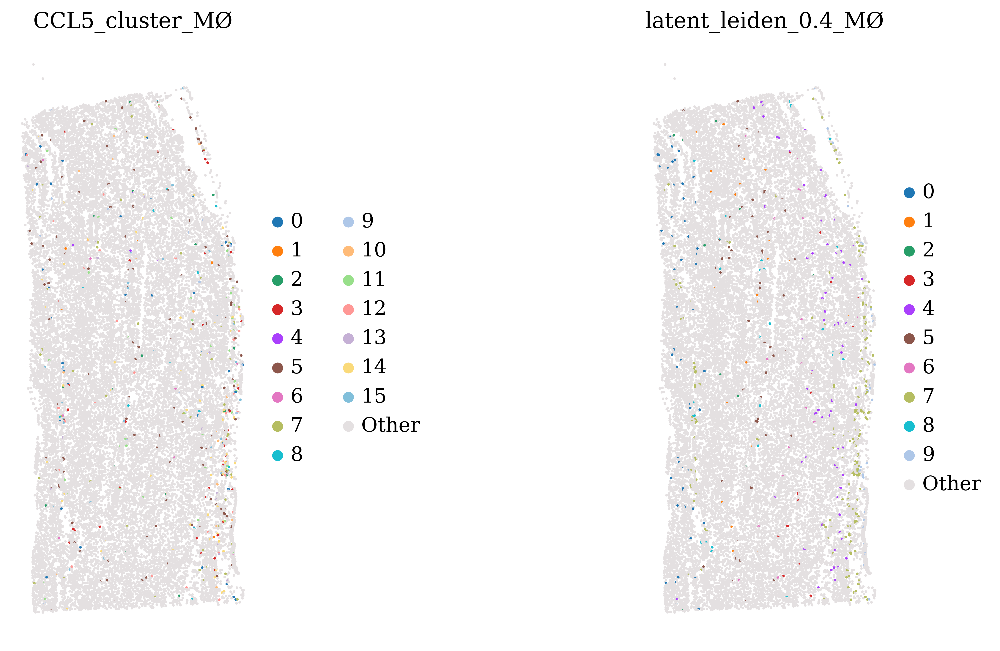

In [36]:
with plt.rc_context():        
    sc.set_figure_params(dpi=300, figsize=(7, 7))         
    sq.pl.spatial_scatter(
        adata_filtered,                 
        library_id="spatial",                 
        shape=None,                 
        color=["CCL5_cluster_MØ", 'latent_leiden_0.4_MØ'],                 
        wspace=0.01,                 
        size=1.5,                 
        frameon=False,                 
        alpha=1.0)         
    plt.savefig(f"{output_dir}/CCL5_clusters_in_MØ_on_tissue_k{k}.png", bbox_inches="tight")

+ Visualize only Niche 9

/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:981: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/amaguza/.local/share/hatch/env/virtual/single-cell-project/HC5eoTg7/single_cell_project/lib/python3.10/site-packages/squidpy/pl/_s

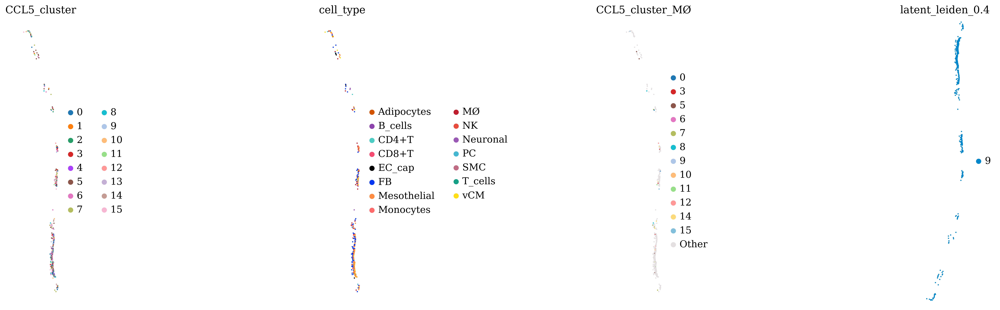

In [47]:
niche = '9'
niche_mask = adata_filtered.obs['latent_leiden_0.4'] == niche
adata_niche = adata_filtered[niche_mask]

# Get the spatial coordinates for this niche
niche_coords = adata_niche.obsm['spatial']
x_coords = niche_coords[:, 0]
y_coords = niche_coords[:, 1]

# Add some padding to create a buffer around the niche
padding = 100  # adjust this value as needed
x_min, x_max = x_coords.min() - padding, x_coords.max() + padding
y_min, y_max = y_coords.min() - padding, y_coords.max() + padding

with plt.rc_context():        
    sc.set_figure_params(dpi=300, figsize=(7, 7))         
    sq.pl.spatial_scatter(
        adata_niche,                  
        library_id="spatial",                 
        shape=None,                 
        color=["CCL5_cluster", 'cell_type', "CCL5_cluster_MØ", 'latent_leiden_0.4'], 
        ncols=4,                
        wspace=0.01,                 
        size=1.5,                 
        frameon=False,                 
        alpha=1.0)
    
    # Set the axis limits to show only the region of interest
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
         
    plt.savefig(f"{output_dir}/niche{niche}_CCL5_MØ_on_tissue_k{k}.png", bbox_inches="tight")